In [1]:
# data management
import pandas as pd
from scipy.io import mmread
from scipy.io import mmwrite
from scipy.sparse import csr_matrix
import scanpy as sc
import anndata as ad
import pickle
import numpy as np

# analysis
import scvelo as scv
import cellrank as cr

scv.settings.set_figure_params("scvelo")
ncores = 32

Load data

In [2]:
pal_data = sc.read_h5ad("../data/processed/velocity_results/pal_data_raw.h5ad")

In [3]:
original_counts = csr_matrix(mmread("../data/processed/ax_regions_data.mtx"))
original_meta = pd.read_csv("../data/processed/ax_regions_meta.csv", index_col = 0)
newnames = [x.replace("-1_1_5", "_D1") for x in original_meta.index.values]
newnames = [x.replace("-1_2_5", "_D2") for x in newnames]
newnames = [x.replace("-1_3_5", "_L1") for x in newnames]
newnames = [x.replace("-1_4_5", "_L2") for x in newnames]
newnames = [x.replace("-1_5_5", "_M1") for x in newnames]
newnames = [x.replace("-1_6_5", "_M2") for x in newnames]

newnames = [x.replace("-1_1", "_a1_1") for x in newnames]
newnames = [x.replace("-1_2", "_a1_2") for x in newnames]
newnames = [x.replace("-1_3", "_a3_1") for x in newnames]
newnames = [x.replace("-1_4", "_a3_2") for x in newnames]

original_meta.index = newnames

original_genes = pd.read_csv("../data/processed/ax_regions_genes.csv", index_col = 0)

In [4]:
keep = pd.Series(original_genes.index.isin(pal_data.var.index.values))
keep = keep[keep].index.values
original_counts = original_counts[:,keep]
original_genes = original_genes.iloc[keep,:]

In [5]:
pal_data = pal_data[original_meta.index.values,original_genes.index.values]

pal_or_data = ad.AnnData(original_counts, obs=pal_data.obs, var = pal_data.var)
pal_or_data.layers["spliced"] = pal_data.layers["spliced"]
pal_or_data.layers["unspliced"] = pal_data.layers["unspliced"]

In [6]:
pal_or_data.obs.cellclusters.value_counts()

glut_SUBSET_0      3883
glut_SUBSET_1      3553
GABA_SUBSET_0      3293
glut_SUBSET_2      3235
GABA_SUBSET_1      2935
glut_SUBSET_3      2925
glut_SUBSET_4      2750
GABA_SUBSET_2      2606
glut_SUBSET_5      2551
glut_SUBSET_6      2329
GABA_SUBSET_3      1821
glut_SUBSET_7      1528
GABA_SUBSET_4      1510
GABA_SUBSET_5      1450
GABA_SUBSET_6       994
glut_SUBSET_8       961
ependymal_0         848
glut_SUBSET_9       845
GABA_SUBSET_7       833
GABA_SUBSET_8       717
glut_SUBSET_10      668
ependymal_1         636
GABA_SUBSET_9       525
ependymal_2         447
ependymal_3         430
ependymal_4         386
ependymal_5         368
endothelial         303
microglia           273
GABA_SUBSET_10      262
ependymal_6         249
neuro_26            240
npc_SUBSET_0        221
glut_SUBSET_11      204
oligodendrocyte     201
npc_SUBSET_1        171
npc_SUBSET_2        158
npc_SUBSET_3        151
npc_SUBSET_4        135
npc_SUBSET_5        121
npc_SUBSET_6        117
npc_SUBSET_7    

## Lateral

In [7]:
#keep1 = np.logical_and(np.logical_or(pal_or_data.obs["cellclusters"].str.startswith("npc"), 
#                                   pal_or_data.obs["cellclusters"].str.startswith("ependymal")),
#                       pal_or_data.obs["all_reg_pred_top"].str.startswith("lateral"))
#keep2 = [x in ["GABA_SUBSET_0", "GABA_SUBSET_10", "GABA_SUBSET_2", "GABA_SUBSET_5", "GABA_SUBSET_4"] for x in pal_or_data.obs["cellclusters"]]
#keep = np.logical_or(keep1, keep2)
#keep = np.logical_and(np.logical_or(np.logical_or(np.logical_or(np.logical_or(pal_or_data.obs["cellclusters"].str.startswith("npc"), 
#                                   pal_or_data.obs["cellclusters"].str.startswith("ependymal")),
#                    pal_or_data.obs["cellclusters"].str.startswith("GABA")),
#                    pal_or_data.obs["cellclusters"].str.startswith("glut")),
#                    pal_or_data.obs["cellclusters"].str.startswith("neuro")),
#                    pal_or_data.obs["all_reg_pred_top"].str.startswith("medial"))
#keep = np.logical_or(np.logical_or(np.logical_or(pal_or_data.obs["cellclusters"].str.startswith("npc"), 
#                                   pal_or_data.obs["cellclusters"].str.startswith("ependymal")),
#                    pal_or_data.obs["cellclusters"].str.startswith("GABA")),
#                    pal_or_data.obs["cellclusters"].str.startswith("glut"))
lat_pal_data = pal_or_data[keep,]
# change X
lat_pal_data._X = lat_pal_data.X # somehow this is necessary
lat_pal_data.shape

(10373, 82958)

In [8]:
lat_pal_data.obs.cellclusters.value_counts()

GABA_SUBSET_0     3293
GABA_SUBSET_2     2606
GABA_SUBSET_4     1510
GABA_SUBSET_5     1450
ependymal_4        276
GABA_SUBSET_10     262
ependymal_5        189
npc_SUBSET_2       138
ependymal_3        126
npc_SUBSET_3        89
ependymal_1         76
npc_SUBSET_8        60
ependymal_7         57
npc_SUBSET_7        50
npc_SUBSET_4        50
npc_SUBSET_9        33
ependymal_0         27
npc_SUBSET_10       23
npc_SUBSET_5        23
npc_SUBSET_6        13
ependymal_2         13
npc_SUBSET_0         6
ependymal_6          3
Name: cellclusters, dtype: int64

In [9]:
scv.pp.filter_genes(lat_pal_data, min_shared_counts=10)
scv.pp.normalize_per_cell(lat_pal_data, enforce=True)
scv.pp.filter_genes_dispersion(lat_pal_data, n_top_genes=10000)
scv.pp.log1p(lat_pal_data)
lat_pal_data.obs["chem_int"] = pd.Categorical(lat_pal_data.obs["chem"]).codes
sc.pp.regress_out(lat_pal_data, keys=["n_counts","initial_size","chem_int"])

Trying to set attribute `.obs` of view, copying.


Filtered out 71757 genes that are detected 10 counts (shared).
Normalized count data: X, spliced, unspliced.
Extracted 10000 highly variable genes.


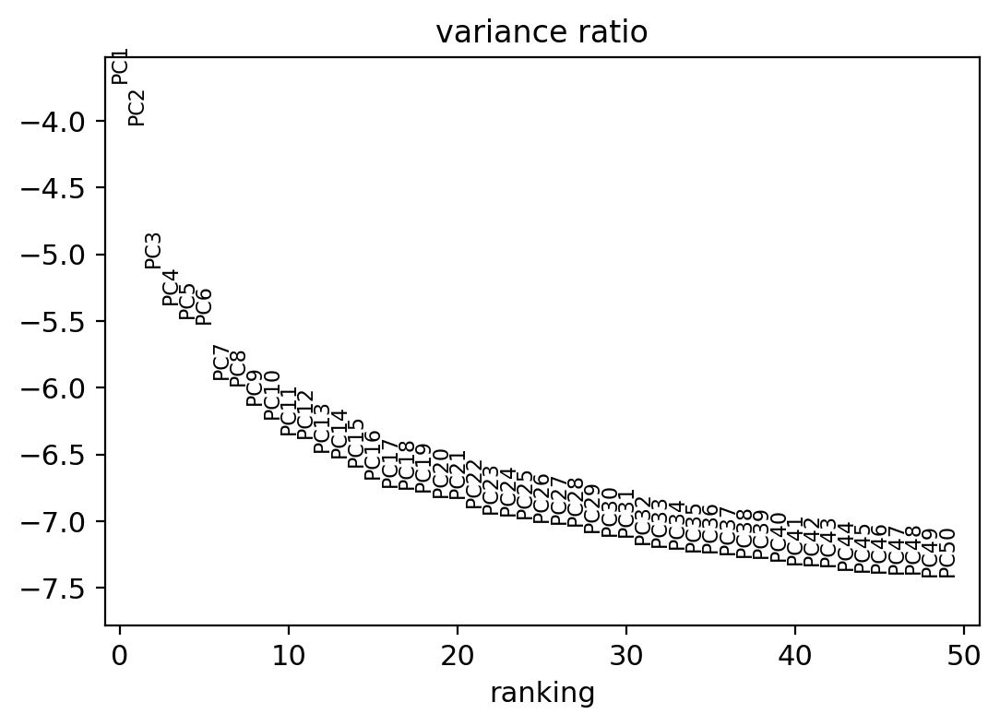

In [10]:
sc.tl.pca(lat_pal_data, n_comps = 50, svd_solver='arpack')
sc.pl.pca_variance_ratio(lat_pal_data, n_pcs=50, log=True)

In [11]:
sc.external.pp.bbknn(lat_pal_data, batch_key = "chem", neighbors_within_batch=5, n_pcs=50)
sc.tl.leiden(lat_pal_data, resolution=0.7, key_added="leiden_07")

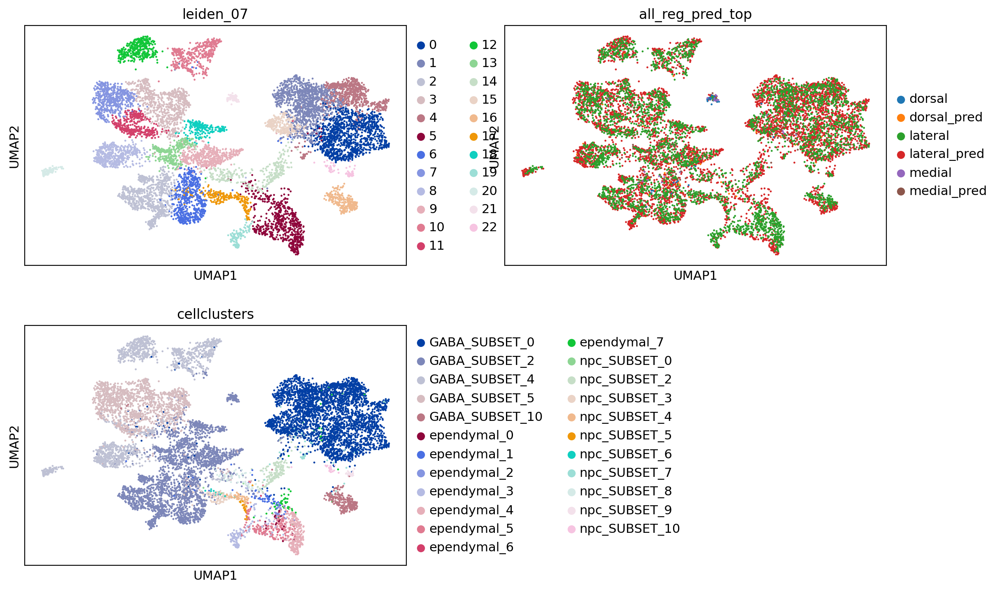

In [12]:
sc.tl.umap(lat_pal_data)
sc.pl.umap(lat_pal_data, color=["leiden_07","all_reg_pred_top","cellclusters"], ncols = 2)

Refilter data

In [13]:
keep1 = [not x in ["2","6"] for x in lat_pal_data.obs.leiden_07]
keep2 = [not x in ["npc_SUBSET_0","npc_SUBSET_1","npc_SUBSET_3","npc_SUBSET_4","npc_SUBSET_5","npc_SUBSET_6"] for x in lat_pal_data.obs.cellclusters]
cells_keep = lat_pal_data.obs.index.values[np.logical_and(keep1, keep2)]
lat_pal_data = pal_or_data[cells_keep,:]
# change X
lat_pal_data._X = lat_pal_data.X # somehow this is necessary
lat_pal_data.shape

(8815, 82958)

Calculate moments

In [13]:
scv.pp.moments(lat_pal_data, n_pcs=50, n_neighbors=30)

computing neighbors
    finished (0:00:11) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:09) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


Recover dynamics

In [14]:
scv.tl.recover_dynamics(lat_pal_data, n_jobs = ncores, max_iter = 500, fit_connected_states = True, fit_basal_transcription = True) # plot_results, use_raw

recovering dynamics (using 32/50 cores)


  0%|          | 0/1106 [00:00<?, ?gene/s]

    finished (0:03:57) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)


/home/tpires/bin/miniconda3/envs/scgen-env/lib/python3.9/site-packages/scvelo/tools/dynamical_model.py:713: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  np.array([dm.alpha, dm.beta, dm.gamma, dm.pars[:3]]) / dm.m[-1]
/home/tpires/bin/miniconda3/envs/scgen-env/lib/python3.9/site-packages/scvelo/tools/dynamical_model.py:716: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  np.array([dm.t, dm.tau, dm.t_, dm.pars[4]]) * dm.m[-1]


Get velocity estimates

In [15]:
scv.tl.velocity(lat_pal_data, mode="dynamical")
scv.tl.velocity_graph(lat_pal_data, n_jobs = ncores)

computing velocities
    finished (0:00:15) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 32/50 cores)


  0%|          | 0/10373 [00:00<?, ?cells/s]

/home/tpires/bin/miniconda3/envs/scgen-env/lib/python3.9/site-packages/scvelo/core/_parallelize.py:138: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  res = np.array(res) if as_array else res


    finished (0:00:09) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


Plot velocity streams

computing velocity embedding
    finished (0:00:02) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


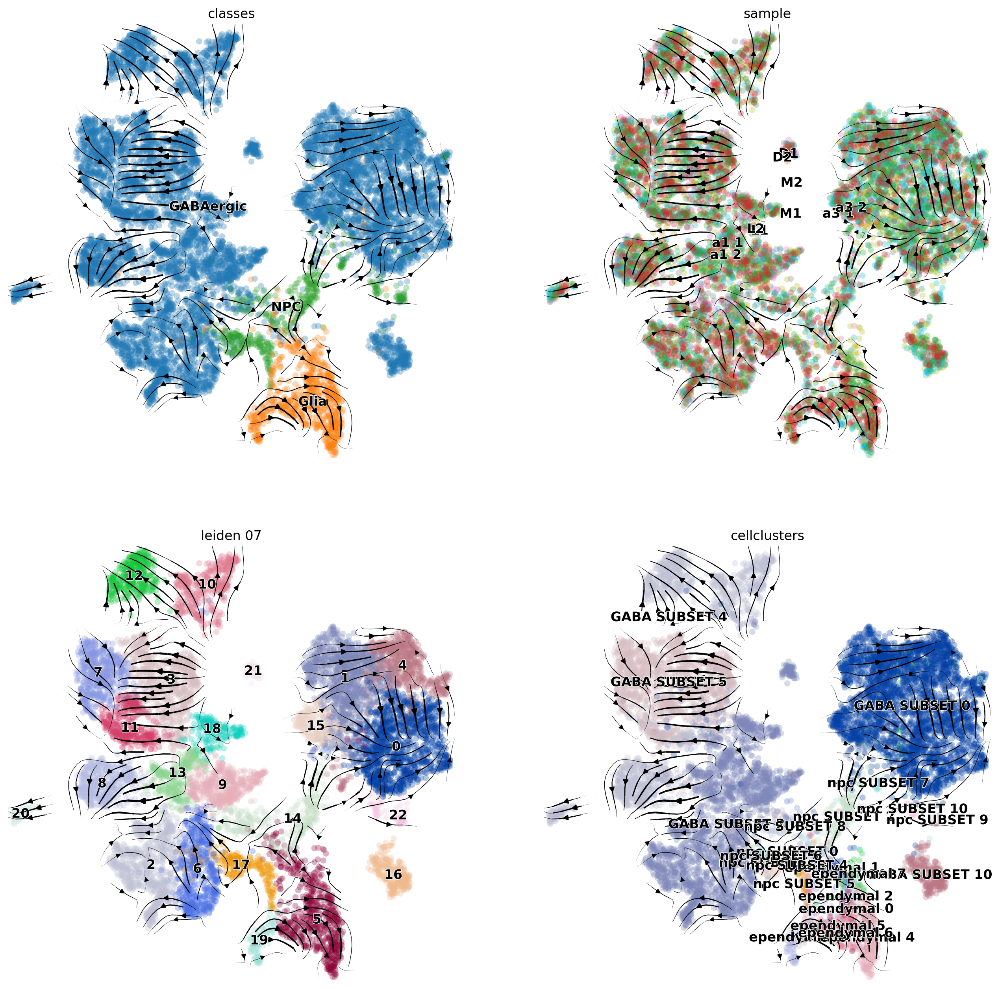

In [16]:
scv.pl.velocity_embedding_stream(lat_pal_data, basis='umap', color=["classes","sample","leiden_07","cellclusters"], 
                                 ncols = 2, figsize = [8,8])

Calculate latent time from velocity streams

computing terminal states
    identified 10 regions of root cells and 3 regions of end points .
    finished (0:00:01) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)
computing latent time using root_cells as prior
    finished (0:00:06) --> added 
    'latent_time', shared time (adata.obs)


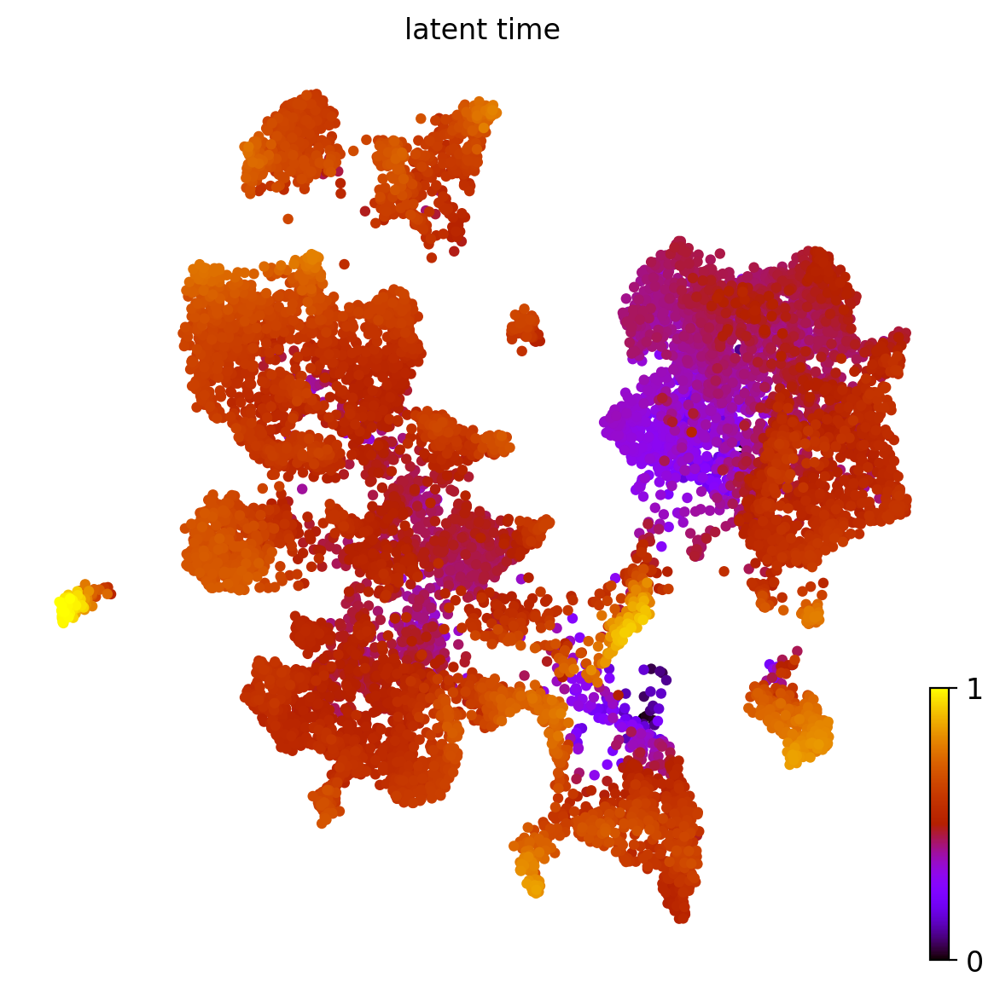

In [17]:
scv.tl.latent_time(lat_pal_data)
scv.pl.scatter(lat_pal_data, color='latent_time', color_map='gnuplot', size=80, colorbar=True, figsize=[7,7])

Calculate differential kinetics

In [21]:
scv.tl.differential_kinetic_test(lat_pal_data, groupby='leiden_07')

testing for differential kinetics
    finished (0:10:33) --> added 
    'fit_diff_kinetics', clusters displaying differential kinetics (adata.var)
    'fit_pvals_kinetics', p-values of differential kinetics (adata.var)


Plot genes illustrating the 3 major branches

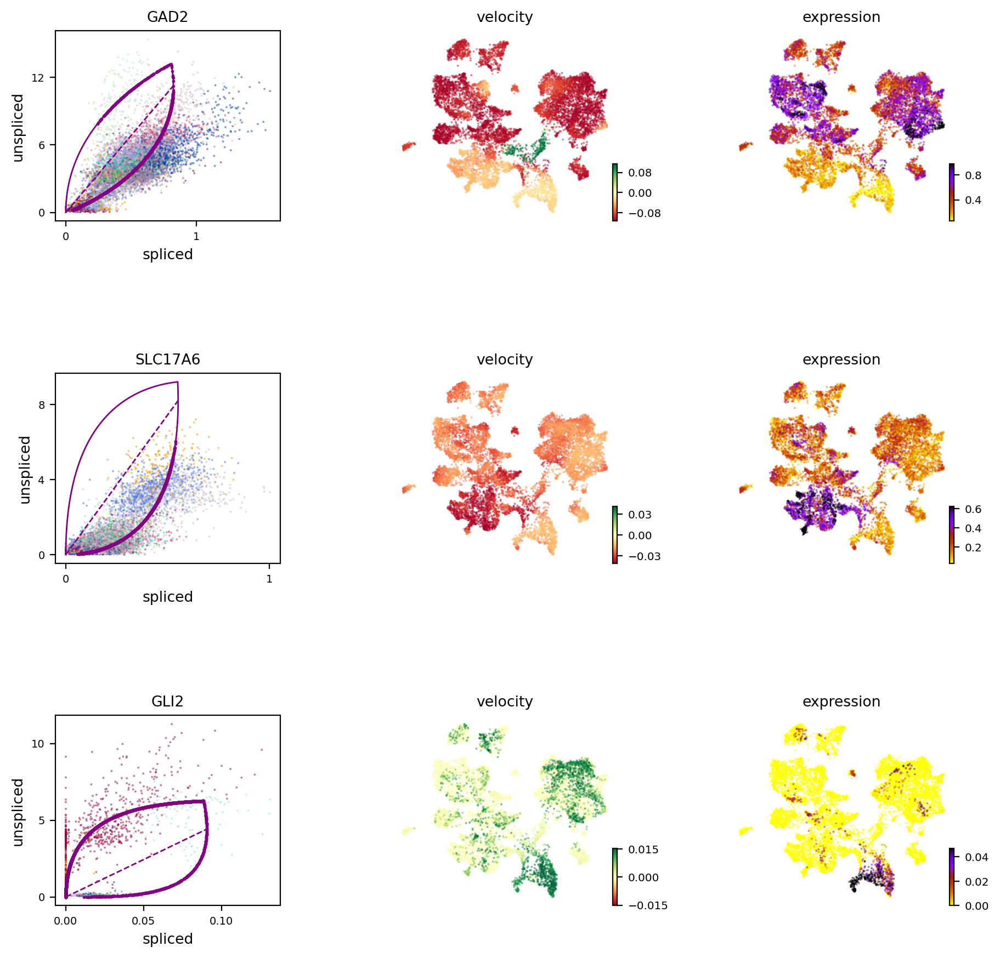

In [18]:
scv.pl.velocity(lat_pal_data, ['GAD2', 'SLC17A6', "GLI2"], ncols=1, figsize = [7,7], color="leiden_07")

Infer cell cycle stage

calculating cell cycle phase
-->     'S_score' and 'G2M_score', scores of cell cycle phases (adata.obs)


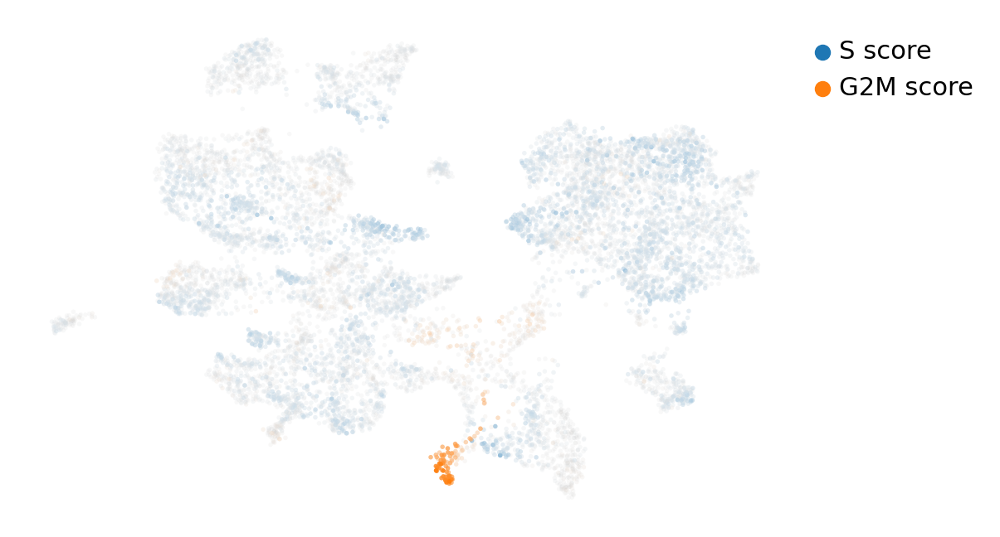

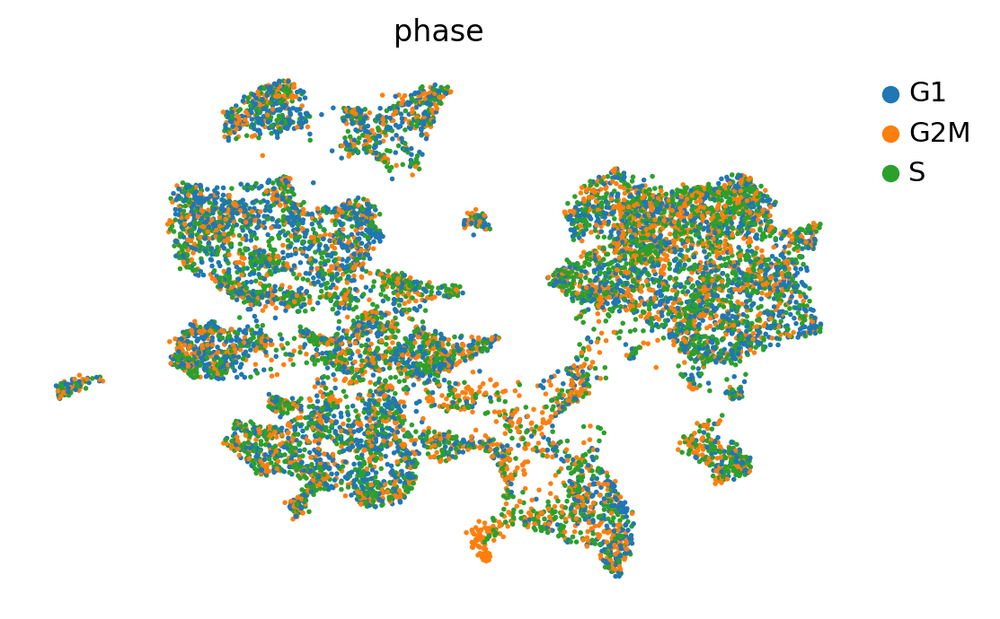

In [19]:
scv.tl.score_genes_cell_cycle(lat_pal_data)
scv.pl.scatter(lat_pal_data, color_gradients=['S_score', 'G2M_score'], smooth=True, perc=[10, 90])
scv.pl.scatter(lat_pal_data, color=['phase'])

Plot velocity estimate length and confidence

--> added 'velocity_length' (adata.obs)
--> added 'velocity_confidence' (adata.obs)
--> added 'velocity_confidence_transition' (adata.obs)


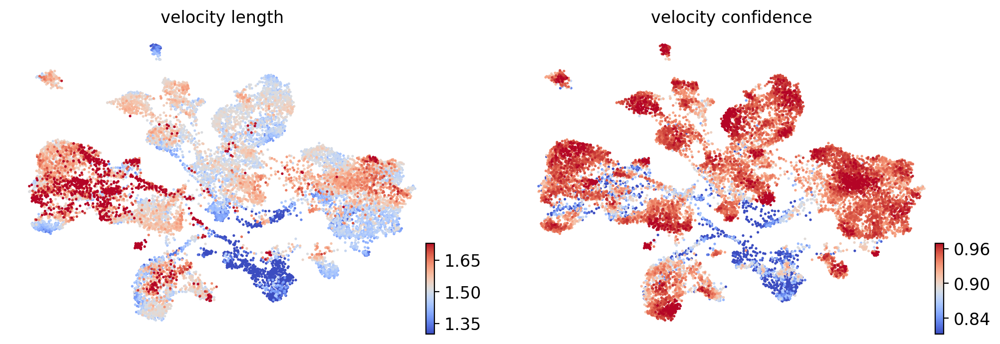

In [24]:
scv.tl.velocity_confidence(lat_pal_data)
keys = 'velocity_length', 'velocity_confidence'
scv.pl.scatter(lat_pal_data, c=keys, cmap='coolwarm', perc=[5, 95])

Velocity by cluster

In [25]:
df = lat_pal_data.obs.groupby('leiden_07')[keys].mean().T
df.style.background_gradient(cmap='coolwarm', axis=1)

leiden_07,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26
velocity_length,1.527966,1.629986,1.466699,1.546179,1.516359,1.476702,1.527222,1.194847,1.502969,1.552829,1.499113,1.529376,1.648515,1.528117,1.451736,1.543469,1.529388,1.595435,1.583942,1.467537,1.411063,1.511731,1.541019,1.347753,1.404754,1.224800,1.919167
velocity_confidence,0.948724,0.937661,0.943527,0.924601,0.926088,0.947645,0.936232,0.795751,0.950346,0.934392,0.941080,0.932656,0.899815,0.904362,0.860392,0.954903,0.905891,0.894564,0.838362,0.931844,0.933454,0.927942,0.935340,0.955743,0.926474,0.919487,0.956431


Plot velocity graph

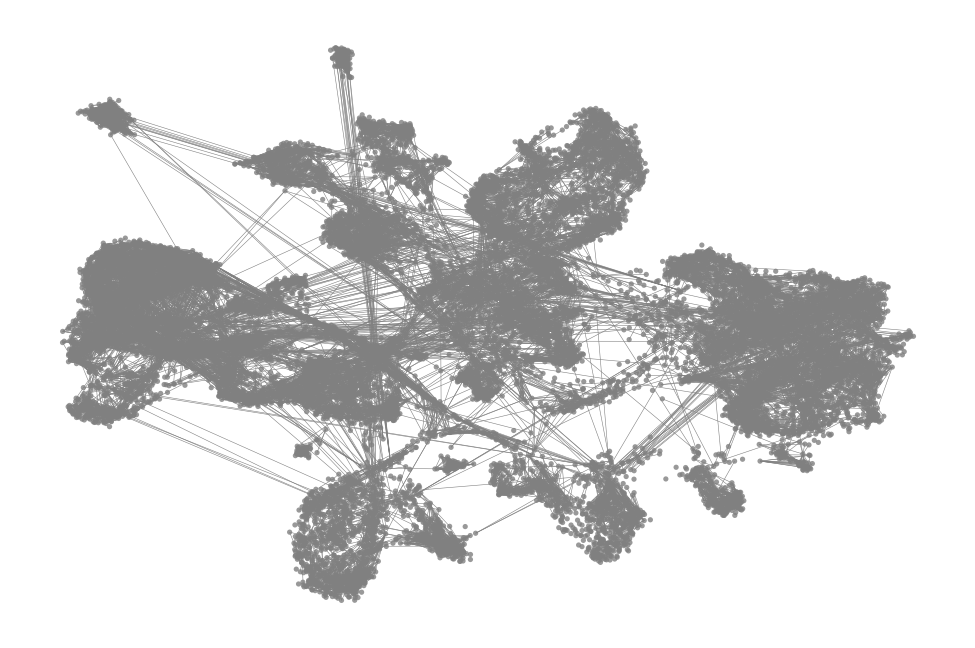

In [26]:
scv.pl.velocity_graph(lat_pal_data, threshold=.2)

Plot cell transitions

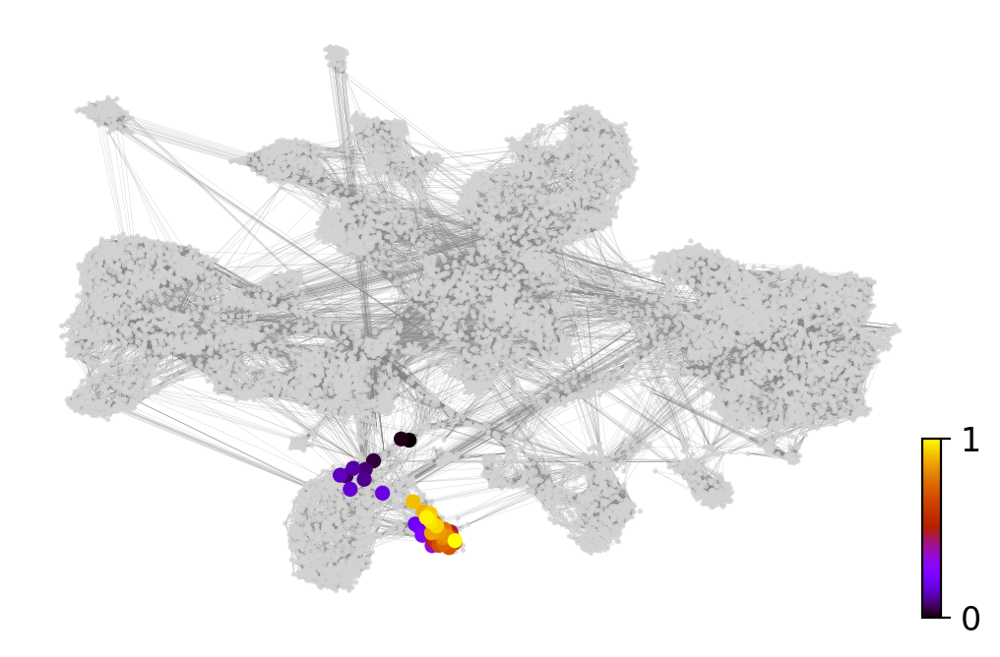

In [27]:
starting_cell = lat_pal_data.obs.sort_values("latent_time").index.values[0]
x, y = scv.utils.get_cell_transitions(lat_pal_data, basis='umap', starting_cell=starting_cell)
ax = scv.pl.velocity_graph(lat_pal_data, c='lightgrey', edge_width=.05, show=False)
ax = scv.pl.scatter(lat_pal_data, x=x, y=y, s=120, c='ascending', cmap='gnuplot', ax=ax)

Get velocity pseudotime (graph-based)

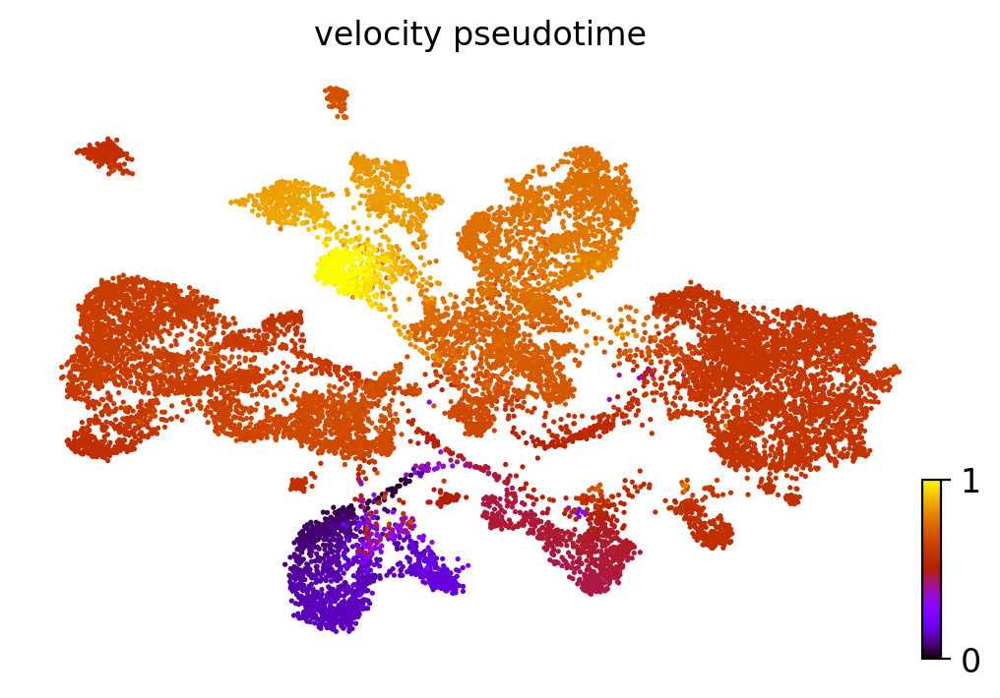

In [28]:
starting_cell = lat_pal_data.obs.sort_values("latent_time").index.values[0]
scv.tl.velocity_pseudotime(lat_pal_data, n_dcs=30, root_key=starting_cell)
scv.pl.scatter(lat_pal_data, color='velocity_pseudotime', cmap='gnuplot')

Get terminal states - scVelo

computing terminal states
    identified 4 regions of root cells and 5 regions of end points .
    finished (0:00:02) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)


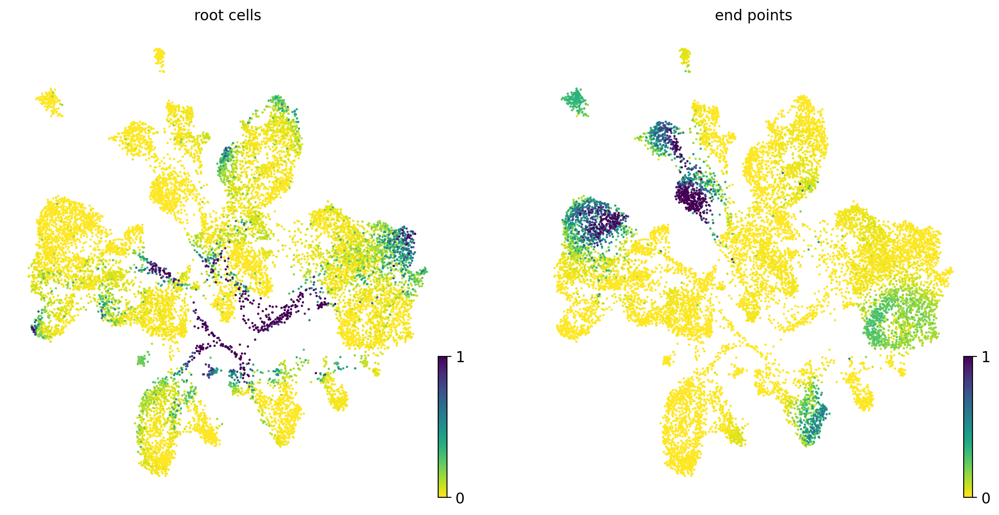

In [29]:
scv.tl.terminal_states(lat_pal_data)
scv.pl.scatter(lat_pal_data, color=['root_cells', 'end_points'], figsize = [7,7])

Generate PAGA

In [31]:
# this is needed due to a current bug - bugfix is coming soon.
lat_pal_data.uns['neighbors']['distances'] = lat_pal_data.obsp['distances']
lat_pal_data.uns['neighbors']['connectivities'] = lat_pal_data.obsp['connectivities']

scv.tl.paga(lat_pal_data, groups='leiden_07', use_time_prior="latent_time", 
            minimum_spanning_tree=False, threshold_root_end_prior=0.9)
df = scv.get_df(lat_pal_data, 'paga/transitions_confidence', precision=2).T
df.style.background_gradient(cmap='Blues').format('{:.2g}')

running PAGA using priors: ['latent_time']
    finished (0:00:03) --> added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns)
    'paga/transitions_confidence', velocity transitions (adata.uns)


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26
0,0,0,0.3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0.11,0,0,0,0,0.12,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0.022,0,0,0.042,0,0,0,0,0,0,0,0,0,0.016,0,0,0.016,0.017,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0.035,0,0.048,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0.02,0,0,0.08,0,0.15,0.013,0,0,0,0,0,0,0,0,0.13,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
9,0.15,0,0.31,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


Plot PAGA

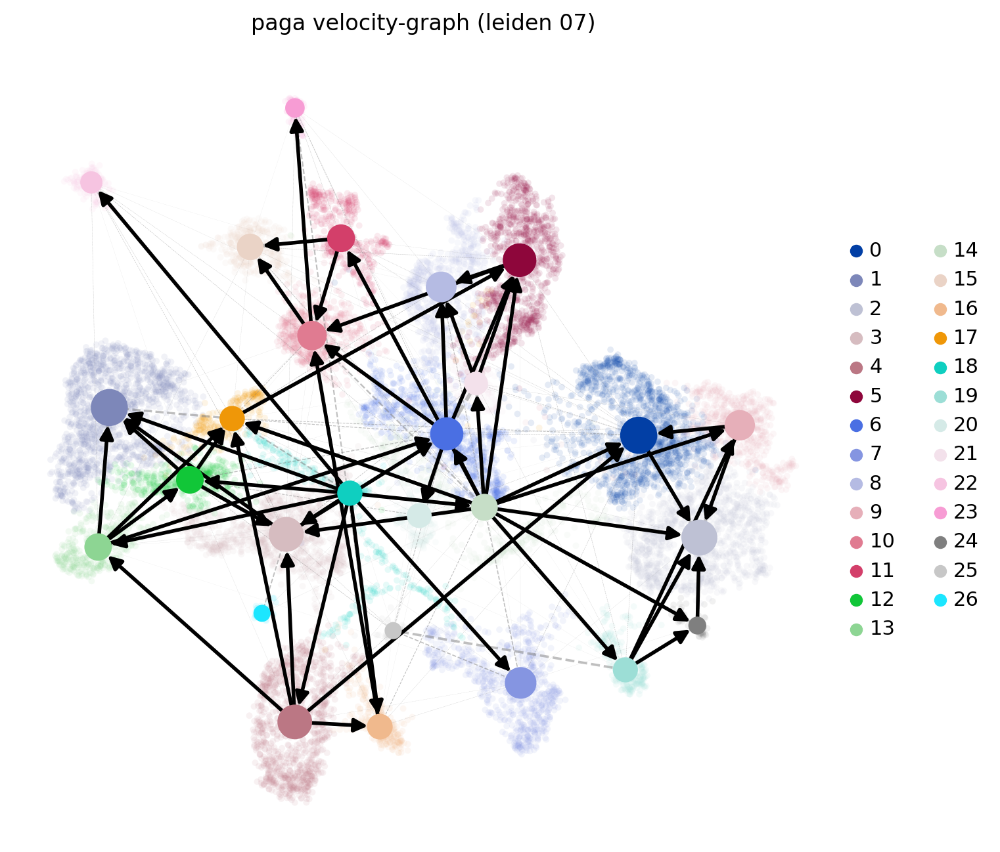

In [32]:
scv.pl.paga(lat_pal_data, basis='umap', size=50, alpha=.1, 
            min_edge_width=2, node_size_scale=1.5, figsize = [8,8])

Start estimator for terminal states

In [34]:
vk = cr.tl.kernels.VelocityKernel(lat_pal_data).compute_transition_matrix()
ck = cr.tl.kernels.ConnectivityKernel(lat_pal_data).compute_transition_matrix()
cvk = 0.75*vk+0.25*ck
g = cr.tl.estimators.GPCCA(cvk)
g.compute_schur(n_components=12)

  0%|          | 0/14424 [00:00<?, ?cell/s]

  0%|          | 0/14424 [00:00<?, ?cell/s]

Mat Object: 1 MPI processes
  type: seqdense
1.0000000000000016e+00 -1.1889656235865699e-04 -7.0094958312491871e-05 -6.8986441603313331e-05 -5.5616310043391578e-04 -3.7335883414231876e-04 -2.1591360238097705e-04 -2.5588033585765913e-03 1.3547267470467434e-03 -4.4843163162206878e-04 -4.5568919409413816e-03 2.4660604635376544e-03 
0.0000000000000000e+00 9.9954110291563025e-01 -1.1312142401519344e-05 1.6376391994910382e-05 -9.1952169695503665e-05 -2.3285028244152966e-05 -2.5131399022321319e-05 -2.0342424038186530e-04 5.1779882526439013e-05 -6.0531688028551450e-05 -8.1986108066874487e-04 2.5279765085203110e-04 
0.0000000000000000e+00 0.0000000000000000e+00 9.9901536011063707e-01 4.0103361664754845e-05 -2.8892815283229379e-04 -1.0374746371207190e-04 3.0482061774557878e-05 -9.7894434151983892e-04 -1.0889020851280516e-03 1.9946754491984882e-04 -4.0783679246616895e-03 -1.1953543113277037e-03 
0.0000000000000000e+00 0.0000000000000000e+00 0.0000000000000000e+00 9.9877388064923545e-01 -1.9582472

Select end point cells

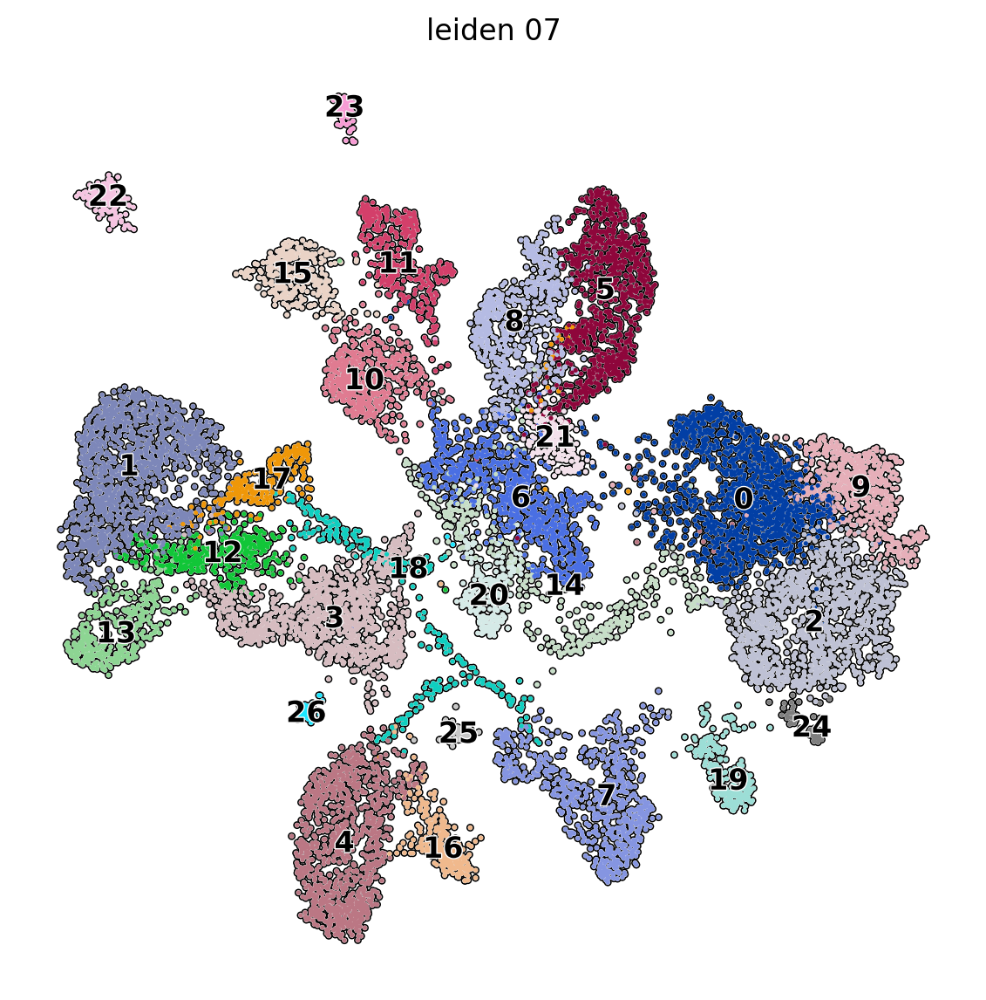

In [35]:
scv.pl.umap(lat_pal_data, color="leiden_07", add_outline=True, figsize=[7,7])

In [41]:
#end_clusters = ["5","18","0","9","4","6","8","2","15"]
end_clusters = ["16","4","13","1","15","11","8","5","0","9","2","7"]
dict_top_ends = {}
for x in end_clusters:
    subdat = lat_pal_data.obs.loc[lat_pal_data.obs["leiden_07"]==x,["leiden_07", "latent_time", "end_points"]].sort_values(["end_points","latent_time"], ascending=[False,False])
    dict_top_ends[x] = subdat.head(30).index.values

/home/tpires/bin/miniconda3/envs/scgen-env/lib/python3.9/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Define the terminal states and compute absorption probabilities

In [42]:
#g.compute_macrostates(cluster_key="leiden_07", n_states = 7)
#g.set_terminal_states_from_macrostates(["6", "0", "2", "8", "3", "1", "13"])
g.set_terminal_states(labels=dict_top_ends, cluster_key="leiden_07")
g.compute_absorption_probabilities()

  0%|          | 0/12 [00:00<?, ?/s]

/home/tpires/bin/miniconda3/envs/scgen-env/lib/python3.9/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


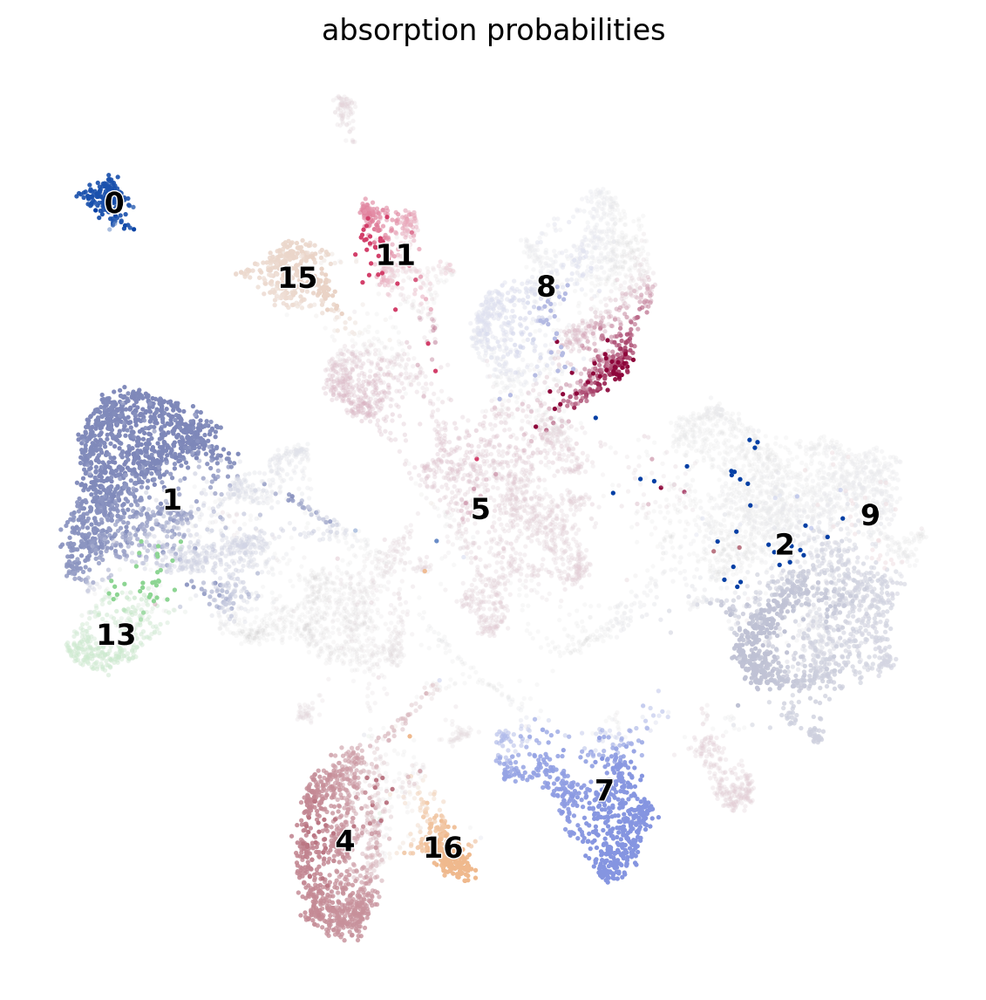

In [43]:
g.plot_absorption_probabilities(figsize=[7,7])

/home/tpires/bin/miniconda3/envs/scgen-env/lib/python3.9/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


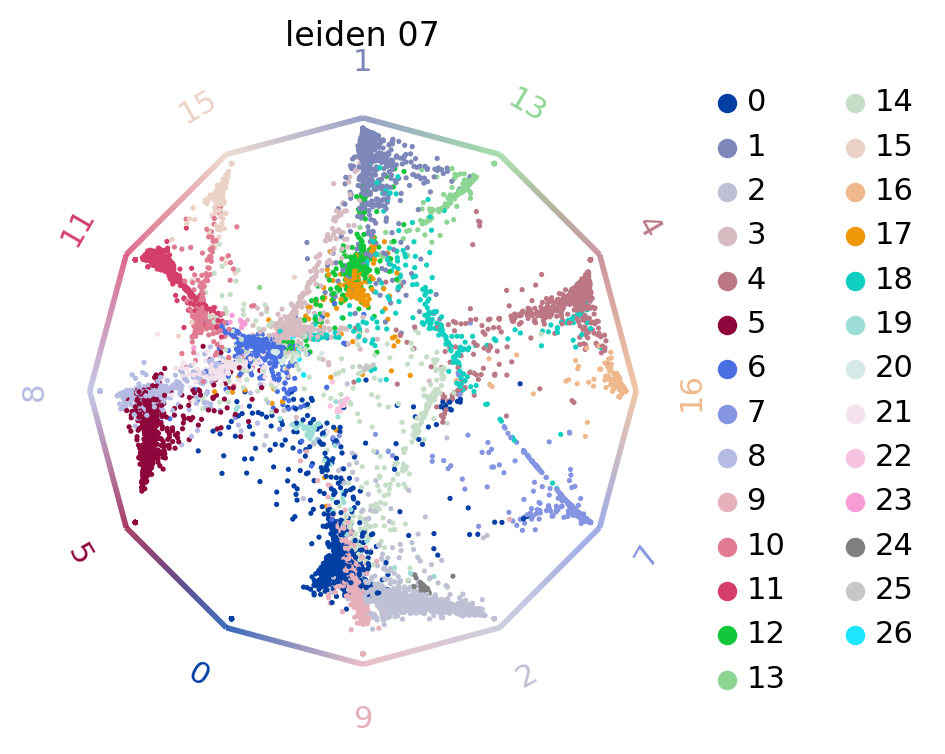

In [44]:
cr.pl.circular_projection(lat_pal_data, keys="leiden_07", lineages=["16","4","13","1","15","11","8","5","0","9","2","7"], 
                          lineage_order="default", legend_loc="right")

Compute drivers for all lineages

In [ ]:
all_drivers = g.compute_lineage_drivers(lineages=end_clusters, return_drivers=True)
for l in end_clusters:
    g.plot_lineage_drivers(l, n_genes=3)

Compute markers for all Leiden 0.7 clusters

In [ ]:
sc.tl.rank_genes_groups(div_data, groupby='leiden_07', method='wilcoxon')
result = div_data.uns['rank_genes_groups']
groups = result['names'].dtype.names
de_res = pd.DataFrame(
    {group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names', 'logfoldchanges', 'pvals_adj']})

Start estimator for starting states

In [ ]:
vk = cr.tl.kernels.VelocityKernel(div_data, backward=True).compute_transition_matrix()
ck = cr.tl.kernels.ConnectivityKernel(div_data, backward=True).compute_transition_matrix()
cvk = 0.75*vk+0.25*ck
gi = cr.tl.estimators.GPCCA(cvk)
gi.compute_schur(n_components=5)

Select start point cells

In [ ]:
st_clusters = ["28"]
dict_top_sts = {}
for x in st_clusters:
    subdat = div_data.obs.loc[div_data.obs["leiden_4"]==x,["high_level_anno","leiden_2", "latent_time", "root_cells"]].sort_values(["root_cells","latent_time"], ascending=[False,True])
    dict_top_sts[x] = subdat.head(30).index.values

Set initial states and compute absorption probabilities

In [ ]:
gi.set_terminal_states(labels=dict_top_sts, cluster_key="leiden_4")
gi.compute_absorption_probabilities()

In [ ]:
gi.plot_absorption_probabilities()

Compute new PAGA

In [ ]:
scv.tl.paga(div_data, groups="leiden_07", root_key="initial_states_probs", end_key="terminal_states_probs", 
            use_time_prior="latent_time", minimum_spanning_tree=False, threshold_root_end_prior=0.98)

In [ ]:
cr.pl.cluster_fates(div_data,mode="paga_pie",cluster_key="leiden_07",basis="umap",legend_kwargs={"loc": "top right out"},
                    legend_loc=None,node_size_scale=5,edge_width_scale=1,max_edge_width=4,title="directed PAGA",figsize=[8,8])

  0%|          | 0/4 [00:00<?, ?gene/s]

/home/tpires/bin/miniconda3/envs/scgen-env/lib/python3.9/site-packages/pygam/utils.py:649: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  bases = (x >= aug_knots[:-1]).astype(np.int) * \
/home/tpires/bin/miniconda3/envs/scgen-env/lib/python3.9/site-packages/pygam/utils.py:650: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. I

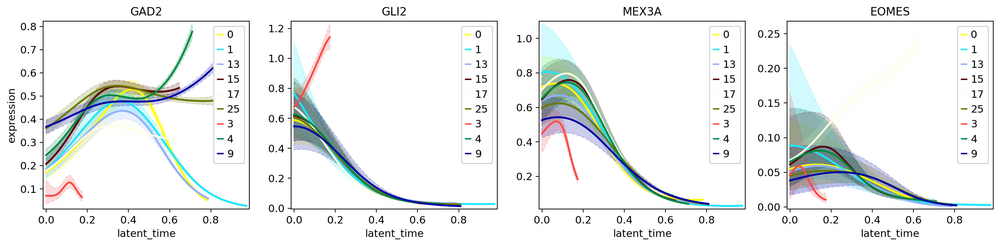

In [118]:
model = cr.ul.models.GAM(div_data)
cr.pl.gene_trends(div_data,model=model,data_key="X",genes=["GAD2","GLI2","MEX3A","EOMES"],ncols=4,
                  time_key="latent_time",same_plot=True,hide_cells=True,figsize=(15, 4),n_test_points=200)